In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import os
from tqdm import tqdm
from PIL import Image

print(os.listdir("../clean vs dirty room project/images"))

['val', 'test', 'images', 'train']


In [2]:
train_messy = "../clean vs dirty room project/images/images/train/messy"
train_clean = "../clean vs dirty room project/images/images/train/clean"
test_messy = "../clean vs dirty room project/images/images/val/messy"
test_clean = "../clean vs dirty room project/images/images/val/clean"
image_size = 128

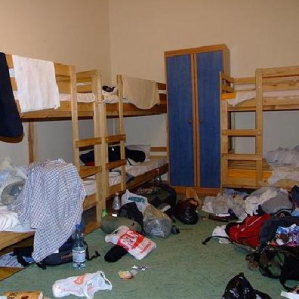

In [3]:
Image.open("../clean vs dirty room project/images/images/train/messy/71.png")

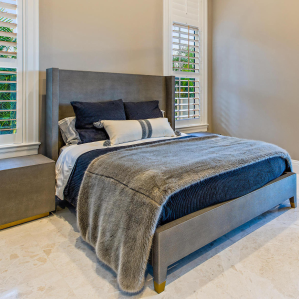

In [4]:
Image.open("../clean vs dirty room project/images/images/train/clean/75.png")

 19%|█▉        | 18/96 [00:01<00:04, 17.54it/s]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
100%|██████████| 96/96 [00:05<00:00, 16.35it/s]


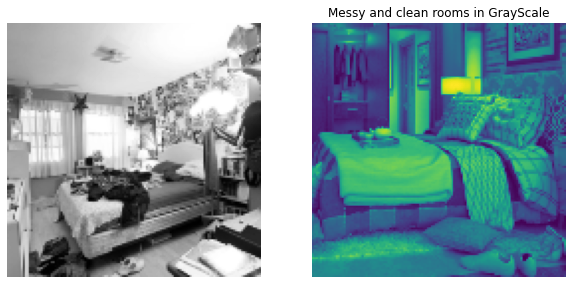

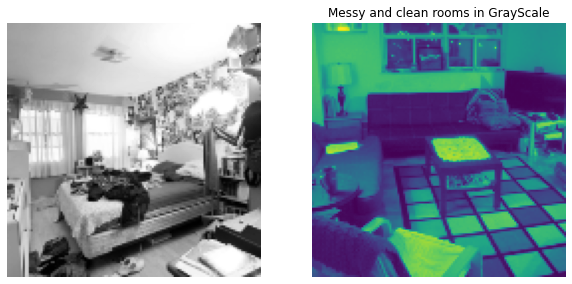

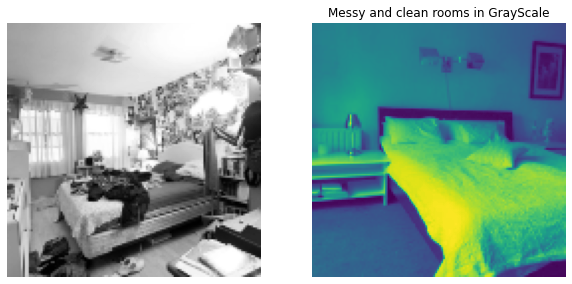

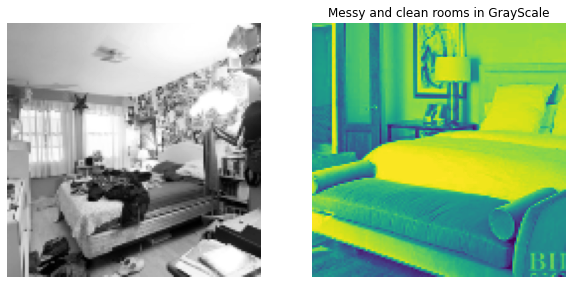

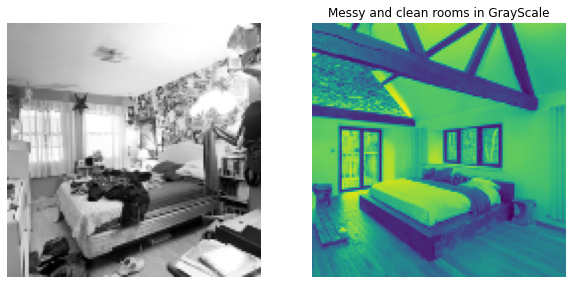

...

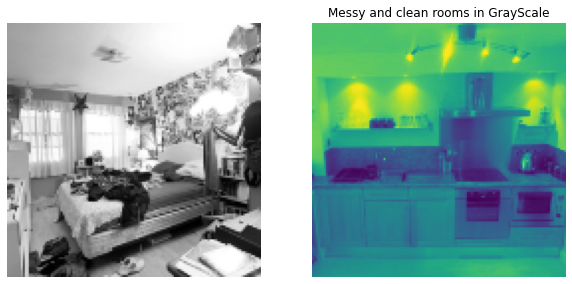

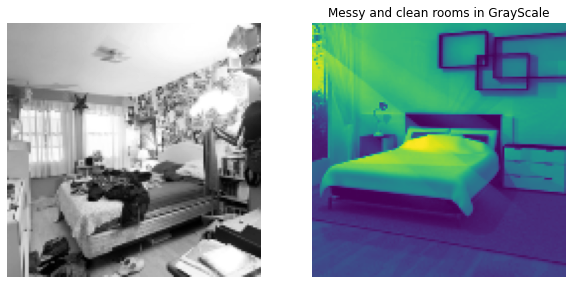

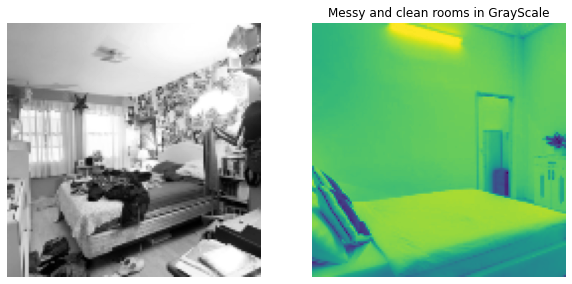

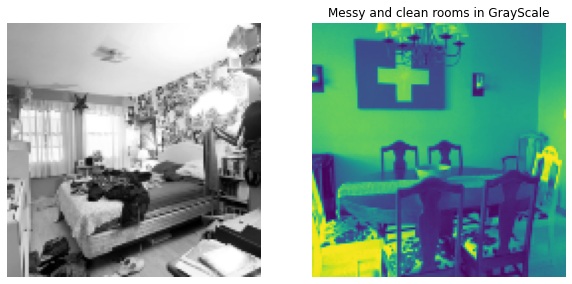

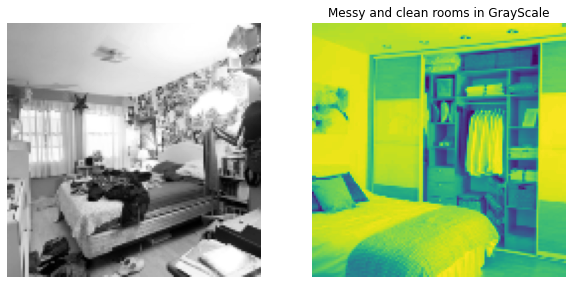

In [5]:
for image in tqdm(os.listdir(train_messy)):
    path = os.path.join(train_messy,image)
    img = cv2.imread(path,cv2.IMREAD_GRAYSCALE)
    img = cv2.resize(img,(image_size,image_size)).flatten()
    np_img = np.asarray(img)
    
for image2 in tqdm(os.listdir(train_clean)):
    path = os.path.join(train_clean,image2)
    img2 = cv2.imread(path,cv2.IMREAD_GRAYSCALE)
    img2 = cv2.resize(img2,(image_size,image_size)).flatten()
    np_img2 = np.asarray(img2)
    
    plt.figure(figsize=(10,10))
    plt.subplot(1,2,1)
    plt.imshow(np_img.reshape(image_size,image_size),cmap='gray')
    plt.axis('off')
    plt.subplot(1,2,2)
    plt.imshow(np_img2.reshape(image_size,image_size))
    plt.axis('off')
    plt.title("Messy and clean rooms in GrayScale")

In [6]:
def train_data():
    train_data_messy = []
    train_data_clean = []
    
    for image1 in tqdm(os.listdir(train_messy)):
        path = os.path.join(train_messy,image1)
        img1 = cv2.imread(path,cv2.IMREAD_GRAYSCALE)
        img1 = cv2.resize(img1,(image_size,image_size))
        train_data_messy.append(img1)
        
    for image2 in tqdm(os.listdir(train_clean)):
        path = os.path.join(train_clean,image2)
        img2 = cv2.imread(path,cv2.IMREAD_GRAYSCALE)
        img2 = cv2.resize(img2,(image_size,image_size))
        train_data_clean.append(img2)
        
    train_data = np.concatenate((np.asarray(train_data_messy),np.asarray(train_data_clean)),axis=0)
    return train_data

In [7]:
def test_data():
    test_data_messy = []
    test_data_clean = []
    
    for image1 in tqdm(os.listdir(test_messy)):
        path = os.path.join(test_messy,image1)
        img1 = cv2.imread(path,cv2.IMREAD_GRAYSCALE)
        img1 = cv2.resize(img1,(image_size,image_size))
        test_data_messy.append(img1)
        
    for image2 in tqdm(os.listdir(test_clean)):
        path = os.path.join(test_clean,image2)
        img2 = cv2.imread(path,cv2.IMREAD_GRAYSCALE)
        img2 = cv2.resize(img2,(image_size,image_size))
        test_data_clean.append(img2)
        
    test_data = np.concatenate((np.asarray(test_data_messy),np.asarray(test_data_clean)),axis=0)
    return test_data

In [8]:
train_data = train_data()
test_data = test_data()

100%|██████████| 10/10 [00:00<00:00, 124.05it/s]


In [9]:
x_data = np.concatenate((train_data,test_data),axis=0)
x_data = (x_data - np.min(x_data))/(np.max(x_data) - np.min(x_data))

In [10]:
m1 = np.ones(96)
c1 = np.zeros(96)
Y_train = np.concatenate((m1,c1),axis=0)
m = np.ones(10)
c = np.ones(10)
Y_test = np.concatenate((m,c),axis=0)

# messy = 1
# clean = 0

In [11]:
y_data = np.concatenate((Y_train,Y_test),axis=0).reshape(x_data.shape[0],1)

In [12]:
print("X shape: ",x_data.shape)
print("Y shape: ",y_data.shape)

X shape:  (212, 128, 128)
Y shape:  (212, 1)


In [13]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(x_data,y_data,test_size=0.15,random_state=42)
number_of_train = x_train.shape[0]
number_of_test = x_test.shape[0]

In [14]:
x_train = x_train.reshape(number_of_train,x_train.shape[1]*x_train.shape[2])
x_test = x_test.reshape(number_of_test,x_test.shape[1]*x_test.shape[2])
y_train = y_train.reshape(number_of_train,)
y_test = y_test.reshape(number_of_test,)

In [15]:
from sklearn.linear_model import LogisticRegression

In [16]:
model = LogisticRegression(max_iter=1000)

In [17]:
x_train.shape,y_train.shape,x_test.shape,y_test.shape

((180, 16384), (180,), (32, 16384), (32,))

In [18]:
model.fit(x_train,y_train)

LogisticRegression(max_iter=1000)

In [19]:
model.score(x_test,y_test)

0.625

In [20]:
ans = model.predict(x_test[:10])

In [21]:
ans = list(map(lambda x: "Messy" if x else "clean",ans))

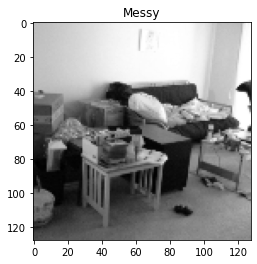

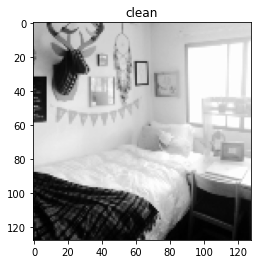

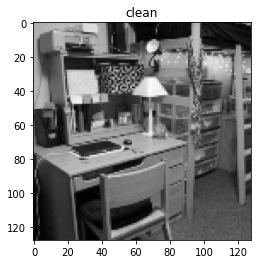

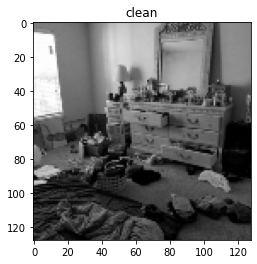

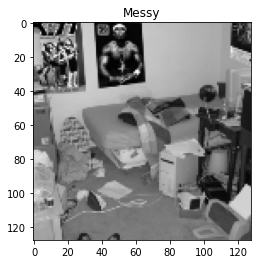

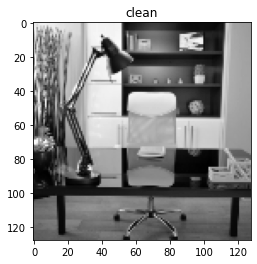

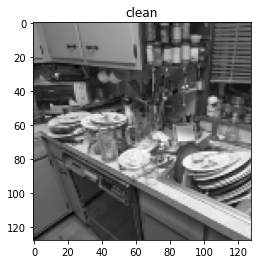

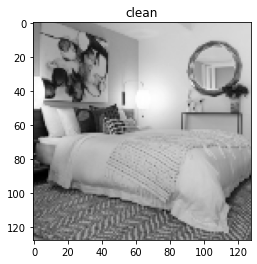

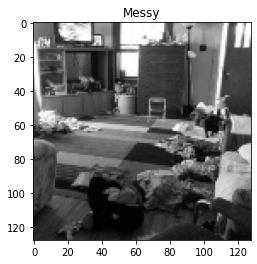

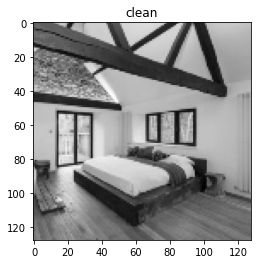

In [22]:
for i in range(len(ans)):
    plt.imshow(x_test[i].reshape(image_size,image_size),cmap='gray')
    plt.title(ans[i])
    plt.show()